In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile
from IPython.display import Audio
%matplotlib inline
import os

In [2]:
# n_components = 4

# A = np.eye(n_components)
# A = np.where(A==0, 0.5, A)

# np.linalg.cond(A)

In [15]:
# load audio

In [3]:
f, x1 = scipy.io.wavfile.read('audio1.wav')

In [4]:
x1.shape

(1000000,)

In [5]:
f, x2 = scipy.io.wavfile.read('audio2.wav')

In [6]:
x2.shape

(1000000,)

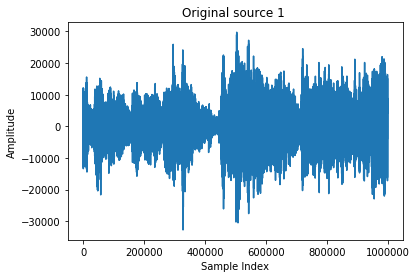

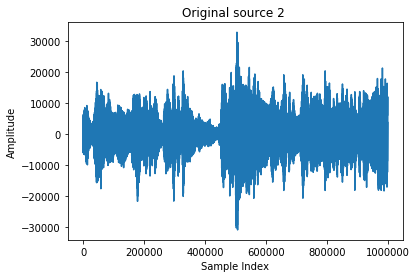

In [19]:
orig = [x1, x2]

# Visualize and play original sources
for i in range(len(orig)):

    s = orig[i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Original source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [20]:
X = np.array([x1, x2])

In [21]:
from sklearn.decomposition import FastICA

In [22]:
X.shape

(2, 1000000)

In [23]:
# To do: whiten! 

In [24]:
transformer = FastICA(n_components=2, random_state=0, whiten=True)

In [25]:
S_est = transformer.fit_transform(X.T)

In [26]:
S_est.shape

(1000000, 2)

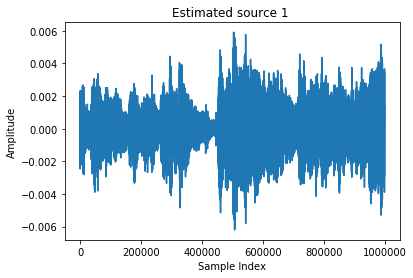

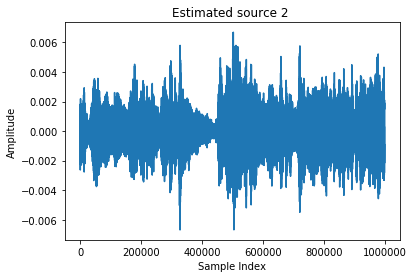

In [27]:
for i in range(S_est.shape[1]):

    s = S_est[:,i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Estimated source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [28]:
from mcc import mean_corr_coef as mcc

In [29]:
mcc(S_est, X.T)

0.8940929185341935